# Analyzing the Dynamic Evolution of Stock Market Networks Through Temporal Graph Modeling



*   Omer Idgar - 323040758
*   Idan Bibi - 211375746




# Import Libraries

In [1]:
%%capture
!pip install igraph
!pip install pycairo
!pip install cairocffi
!pip install pyvis
!pip install dash

import yfinance as yf
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
from tqdm import tqdm
import networkx as nx
import networkx.algorithms.community as nxcom
import community
import community.community_louvain as cl
import igraph as ig
from tabulate import tabulate
from pyvis import network as net
from IPython.core.display import display, HTML
import plotly.graph_objects as go
import seaborn as sns
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import colorsys
import os
import plotly.express as px
from collections import defaultdict

# Load Data

To commence our analysis of the dynamics of the 500 stock chains within the S&P 500 index between 2015 and 2022, we initiated our process with the acquisition of a dataset from Kaggle. This dataset provided essential information regarding the 500 stocks, including their names, ticker symbols, and the sectors they belong to.

In [2]:
df_SP500 = pd.read_csv('datasets/List of SP 500 companies.csv')

In [3]:
df_SP500

,Symbol,Name,Sector
0,MMM,3M Company,Industrials
1,AOS,A.O. Smith Corp,Industrials
2,ABT,Abbott Laboratories,Health Care
3,ABBV,AbbVie Inc.,Health Care
4,ABMD,ABIOMED Inc,Health Care
...,...,...,...
500,YUM,Yum! Brands Inc,Consumer Discretionary
501,ZBRA,Zebra Technologies,Information Technology
502,ZBH,Zimmer Biomet Holdings,Health Care
503,ZION,Zions Bancorp,Financials


Our approach involved utilizing the yfinance package to extract the stock details for the specified years. Through API calls, we fetched the stock data by symbol, starting from January 1, 2015, and concluding on December 31, 2022. These retrieved details encompassed the stock's daily values during this timeframe.

To streamline the dataset and align it with our objectives, we applied filtering criteria. Stocks with no recorded values throughout the entire period were systematically removed from consideration. This filtering ensured that we focused solely on stocks with comprehensive data, essential for accurate analysis.

In [4]:
def get_stock_data(symbol, start_date, end_date):
    stock_data = yf.download(symbol, start=start_date, end=end_date, progress=False)
    stock_data.reset_index(inplace=True)
    stock_data.insert(0,'Symbol', symbol)
    return stock_data.iloc[:,:-1]

def get_stock_df(start_date, end_date, total_rows, pickle_filename):
    if os.path.exists(pickle_filename):
        return pd.read_pickle(pickle_filename)
    df_stocks = []
    for symbol in tqdm(df_SP500['Symbol']):
        stock_data = get_stock_data(symbol, start_date, end_date)
        if len(stock_data) == total_rows:
            df_stocks.append(stock_data)
    df_stocks = pd.concat(df_stocks)

    df_stocks.to_pickle(pickle_filename)

In [5]:
pickle_filename = 'datasets/df_stocks.pkl'
start_date = '2015-01-01'
end_date = '2022-12-31'
TOTAL_ROWS = 2014
df_stocks = get_stock_df(start_date, end_date, TOTAL_ROWS,pickle_filename)

In [6]:
df_stocks

,Symbol,Date,Open,High,Low,Close,Adj Close
0,MMM,2015-01-02,164.710007,165.080002,162.729996,164.059998,124.923103
1,MMM,2015-01-05,163.000000,163.639999,160.080002,160.360001,122.105759
2,MMM,2015-01-06,160.820007,161.369995,157.740005,158.649994,120.803673
3,MMM,2015-01-07,159.899994,160.279999,158.940002,159.800003,121.679352
4,MMM,2015-01-08,160.649994,163.690002,160.520004,163.630005,124.595734
...,...,...,...,...,...,...,...
2009,ZTS,2022-12-23,144.509995,145.889999,143.539993,145.759995,144.788239
2010,ZTS,2022-12-27,145.910004,146.149994,143.570007,145.300003,144.331314
2011,ZTS,2022-12-28,145.179993,146.639999,143.770004,143.830002,142.871109
2012,ZTS,2022-12-29,145.199997,148.509995,145.139999,148.149994,147.162292


In conclusion, this initial data extraction phase laid the groundwork for our comprehensive analysis. We extracted stock data, filtered for completeness, and organized it into a structured dataframe, ready for the subsequent stages of data cleaning and further analysis.

# Preprocess

In the data cleaning and preprocessing phase, our objective is to prepare the collected stock data for meaningful analysis. We will filter the data to focus on S&P 500 companies, eliminate duplicates, handle missing values, and calculate daily log returns. These operations will enhance the quality and consistency of our data, ensuring that it is suitable for subsequent analysis.

In [7]:
def filter_by_sp500_companies(df_stocks, df_sp500):
    """
    Filter stock data by S&P 500 companies.

    Args:
    - df_stocks (DataFrame): Stock data.
    - df_sp500 (DataFrame): S&P 500 data.

    Returns:
    - DataFrame: Filtered stock data.
    """
    df_stocks = df_stocks.copy()
    symbols = df_sp500['Symbol'].tolist()
    excluded_symbols = ['GOOG', 'FOX', 'UA', 'DISCK', 'NWS']
    return df_stocks[df_stocks['Symbol'].isin(symbols) & ~df_stocks['Symbol'].isin(excluded_symbols)]

def preprocess_stock_data(df_stocks, df_sp500):
    """
    Preprocess stock data by performing various cleaning and transformation tasks.

    Args:
    - df_stocks (DataFrame): Stock data.
    - df_sp500 (DataFrame): S&P 500 data.

    Returns:
    - DataFrame: Preprocessed stock data.
    """
    df_stocks = df_stocks.copy()
    df_filtered = filter_by_sp500_companies(df_stocks, df_sp500)

    col_close_price = 'Adj Close'
    df_stock_prices = df_filtered[['Symbol', 'Date', col_close_price]]

    # Remove duplicates and format date field
    df_stock_prices = df_stock_prices.drop_duplicates(keep='last')
    df_stock_prices['Date'] = pd.to_datetime(df_stock_prices['Date'], format='%Y%m%d', errors='ignore')
    df_stock_prices.set_index(['Date', 'Symbol'], inplace=True)
    df_daily_returns = df_stock_prices.unstack()[col_close_price]
    df_daily_returns.reset_index(inplace=True)

    # Fill missing values
    df_daily_returns.fillna(method='bfill', inplace=True)
    df_daily_returns.fillna(method='ffill', inplace=True)

    # Compute daily log returns
    for column in df_daily_returns.columns.values.tolist()[1:]:
        df_daily_returns[column] = np.log(df_daily_returns[column]) - np.log(df_daily_returns[column].shift(1))

    df_daily_returns.set_index('Date',inplace=True)
    df_daily_returns.fillna(method='bfill',inplace=True)
    df_daily_returns.fillna(method='ffill',inplace=True)

    return df_daily_returns


df_daily_returns = preprocess_stock_data(df_stocks, df_SP500)

In [8]:
df_daily_returns

Symbol,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XEL,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-02,-0.018916,-0.000557,-0.013268,-0.028576,-0.018998,-0.008548,0.000223,-0.017029,-0.004989,-0.018353,...,-0.011416,-0.027743,-0.006957,-0.022060,-0.064258,-0.020527,0.036625,-0.014177,-0.038189,-0.006021
2015-01-05,-0.018916,-0.000557,-0.013268,-0.028576,-0.018998,-0.008548,0.000223,-0.017029,-0.004989,-0.018353,...,-0.011416,-0.027743,-0.006957,-0.022060,-0.064258,-0.020527,0.036625,-0.014177,-0.038189,-0.006021
2015-01-06,-0.015700,-0.015713,-0.000703,0.000094,-0.004962,0.005448,-0.011421,-0.007239,-0.020350,-0.023753,...,0.005307,-0.005330,-0.012488,-0.013473,-0.005898,-0.012350,-0.008513,-0.007231,-0.038942,-0.009804
2015-01-07,0.013185,-0.000566,0.021261,0.013925,0.039621,0.019763,0.008076,0.020772,0.008190,0.010461,...,0.008598,0.010081,0.025588,0.012729,0.007856,0.032601,0.024566,0.025146,0.009500,0.020432
2015-01-08,0.029535,0.012187,0.008727,0.037702,0.010404,0.002281,0.020345,0.015134,0.025135,0.017501,...,0.011532,0.016508,0.024389,0.027158,0.007518,0.017270,0.010561,0.021134,0.013897,0.015281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,0.001475,0.011872,0.008411,-0.002802,-0.001042,0.004362,0.001388,0.005011,0.005719,0.000549,...,0.012770,0.026101,0.011057,-0.003416,-0.000729,0.000621,0.001106,0.002864,0.003515,0.005021
2022-12-27,0.002142,-0.014263,0.012071,-0.013976,-0.000675,-0.005959,0.003599,-0.002936,-0.009977,-0.010060,...,0.008983,0.013798,0.007512,0.006141,0.008982,0.007728,0.004646,0.011137,0.008017,-0.003161
2022-12-28,-0.009811,-0.016902,0.001929,-0.031166,-0.004674,-0.009751,-0.006839,-0.008289,-0.020380,-0.011908,...,-0.007229,-0.016563,-0.034579,-0.022705,-0.016207,-0.004552,-0.010187,-0.016713,-0.017974,-0.010169


Following the data cleaning and preprocessing operations, we have successfully transformed the raw stock data into a structured and refined dataset. The `df_daily_returns` dataframe now holds the calculated daily log returns for each stock within the specified timeframe. By addressing duplicates, filling missing values, and computing returns, we have established a solid foundation for comprehensive analysis. This clean dataset will enable us to delve into correlation analysis, network construction, and dynamic network analysis with a higher level of confidence and accuracy.

In this phase, we aim to calculate correlations between the companies' returns over distinct time periods. By employing the `periodic_correlations()` function, we will derive correlation matrices for specified intervals, such as annually or monthly. This operation will provide us with insights into the changing relationships among the stocks, enabling us to explore how they interact over time.


In [9]:
def periodic_correlations(df, freq='A'):
    """
    Calculate the correlation between the companies for each period (e.g., annually, monthly.).

    :param df: Data frame where each row is a date and each column is a company.
               The index of the data frame should be of type datetime.
               The values in each cell are the return of the stock on the respective date.
    :param freq: Frequency for which correlations are to be calculated.
                 'A' for annual, 'M' for monthly.
    :return: A dictionary where keys are periods and values are correlation matrices for that period.
    """

    df.index = pd.to_datetime(df.index)

    periods = df.resample(freq).mean().index
    periodic_corr = {}

    for period in periods:
        if freq == 'A':
            subset = df[df.index.year == period.year]
            periodic_corr[f'{period.year}'] = subset.corr()
        elif freq == 'M':
            subset = df[(df.index.year == period.year) & (df.index.month == period.month)]
            periodic_corr[f'{period.month}-{period.year}'] = subset.corr()

    return periodic_corr

correlations = periodic_correlations(df_daily_returns, freq='A')

After performing the periodic correlation calculations, we now possess a set of correlation matrices that capture the relationships between companies' returns over various time periods. These matrices are organized based on the chosen frequency, whether it be annual or monthly interval.

The resulting `correlations` dictionary holds correlation matrices for each period, allowing us to discern trends in the stock market dynamics. By analyzing these matrices, we can identify whether certain stocks tend to move in tandem or exhibit divergent behaviors during different periods. This provides us with a nuanced perspective on how stock relationships evolve over time, a critical component in comprehending the stock market's dynamic nature. These insights are fundamental for the subsequent construction of networks and the exploration of sectoral patterns within the stock market ecosystem.

For example lets see the correlation matrix for 2015:

In [10]:
correlations['2015']

Symbol,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XEL,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Symbol,,,,,,,,,,,,,,,,,,,,,
A,1.000000,0.336816,0.339231,0.526470,0.520966,0.458179,0.673345,0.663781,0.513187,0.511437,...,0.370898,0.578639,0.607577,0.581592,0.609410,0.367094,0.549804,0.440204,0.588396,0.452502
AAL,0.336816,1.000000,0.234035,0.305711,0.258307,0.329518,0.390234,0.369024,0.329203,0.266522,...,0.244481,0.178495,0.412989,0.252347,0.203634,0.205363,0.296556,0.111159,0.208260,0.258618
AAP,0.339231,0.234035,1.000000,0.249665,0.289699,0.210610,0.369556,0.304754,0.287326,0.214010,...,0.271348,0.296969,0.299967,0.269581,0.338604,0.319759,0.307206,0.320850,0.346809,0.238027
AAPL,0.526470,0.305711,0.249665,1.000000,0.252376,0.319498,0.461193,0.512126,0.448410,0.502049,...,0.253853,0.428490,0.466356,0.422374,0.477943,0.342033,0.316507,0.466688,0.402407,0.336295
ABBV,0.520966,0.258307,0.289699,0.252376,1.000000,0.396391,0.482175,0.321692,0.344420,0.313701,...,0.262734,0.325629,0.407839,0.290584,0.321855,0.280843,0.492160,0.290314,0.328959,0.406228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YUM,0.367094,0.205363,0.319759,0.342033,0.280843,0.309391,0.369172,0.344227,0.482723,0.288599,...,0.242879,0.248196,0.292707,0.221436,0.290880,1.000000,0.272490,0.265955,0.308178,0.229413
ZBH,0.549804,0.296556,0.307206,0.316507,0.492160,0.395644,0.634710,0.441372,0.400142,0.349364,...,0.311588,0.408696,0.490681,0.377511,0.339859,0.272490,1.000000,0.276931,0.374016,0.406002
ZBRA,0.440204,0.111159,0.320850,0.466688,0.290314,0.250564,0.365884,0.396478,0.273785,0.371995,...,0.080576,0.335673,0.309216,0.402548,0.372017,0.265955,0.276931,1.000000,0.379686,0.292067


# Stock Network Analysis

## Stock Correlation Network Over Time

The combination of two insightful visualizations enhances our understanding of stock dynamics and network behavior over time. We present a correlation network plot and a set of line plots depicting key network metrics. These visualizations collectively offer a comprehensive view of stock relationships and network characteristics, enabling us to glean valuable insights into the intricate nature of the stock market.

The correlation network plot illustrates the interconnections between stocks, with nodes representing individual stocks and edges indicating strong correlations surpassing a specified threshold (`threshold_corr`). By employing sector-based coloring, we enhance our understanding of sector-related interactions. This visualization's dynamic nature, controlled by the year slider, allows us to observe changes in network structures across the years.

The line plots, derived from the `network_metrics_separate()` function, provide valuable insights into network metrics' evolution. "Average Degree Over Time" showcases the changing average connections per stock, offering insights into the network's interconnectedness. "Avg. Clustering Coefficient Over Time" reveals cluster formations, indicating groups of interconnected stocks. The "Number of Components Over Time" plot uncovers community structures within the network.


In [11]:
def create_graph_from_corr(correlation_matrix, threshold_corr, singleton=False):
    G = nx.Graph()
    for stock in correlation_matrix.columns:
        if singleton:
            G.add_node(stock)
        for other_stock in correlation_matrix.columns:
            if stock != other_stock:
                corr = correlation_matrix.loc[stock, other_stock]
                if corr >= threshold_corr:
                    G.add_edge(stock, other_stock, weight=corr)
    return G

In [12]:
def network_metrics_separate(correlation_matrices, threshold_corr=0.5):
    dates = list(correlation_matrices.keys())
    avg_degrees = []
    avg_cluster_coeffs = []
    num_components = []

    for date, corr_matrix in correlation_matrices.items():
        G = create_graph_from_corr(corr_matrix, threshold_corr)
        avg_degrees.append(np.mean(list(dict(G.degree()).values())))
        avg_cluster_coeffs.append(nx.average_clustering(G))
        num_components.append(nx.number_connected_components(G))

    # Plot Average Degree Over Time
    plt.figure(figsize=(10, 3))
    plt.plot(dates, avg_degrees, marker='o', label='Average Degree')
    plt.title("Average Degree Over Time")
    plt.xlabel("Date")
    plt.ylabel("Average Degree")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot Avg. Clustering Coefficient Over Time
    plt.figure(figsize=(10, 3))
    plt.plot(dates, avg_cluster_coeffs, marker='o', label='Avg. Clustering Coefficient')
    plt.title("Avg. Clustering Coefficient Over Time")
    plt.xlabel("Date")
    plt.ylabel("Avg. Clustering Coefficient")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot Number of Components Over Time
    plt.figure(figsize=(10, 3))
    plt.plot(dates, num_components, marker='o', label='Number of Components')
    plt.title("Number of Components Over Time")
    plt.xlabel("Date")
    plt.ylabel("Number of Components")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [13]:
def plot_correlation_network(correlation_matrices, threshold_corr=0.5):
    stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))
    ticker_to_name = dict(zip(df_SP500['Symbol'], df_SP500['Name']))
    unique_sectors = df_SP500['Sector'].unique()
    colors_palette = px.colors.qualitative.Set3
    sector_to_color = dict(zip(unique_sectors, colors_palette))
    sliders = [{'active': 0, 'yanchor': 'top', 'xanchor': 'left', 'currentvalue': {'font': {'size': 20}, 'prefix': 'Date:', 'visible': True, 'xanchor': 'right'}, 'transition': {'duration': 300, 'easing': 'cubic-in-out'}, 'pad': {'b': 10, 't': 50}, 'len': 0.9, 'x': 0.1, 'y': 0, 'steps': []}]
    fig_data = []

    for date, corr_matrix in correlation_matrices.items():
        G = nx.Graph()
        for i, stock1 in enumerate(corr_matrix.columns):
            for j, stock2 in enumerate(corr_matrix.columns):
                if i < j and corr_matrix.iloc[i, j] >= threshold_corr:
                    G.add_edge(stock1, stock2, weight=corr_matrix.iloc[i, j])
        pos = nx.spring_layout(G)
        edge_x, edge_y = [], []
        for edge in G.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])
        edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', showlegend=False, mode='lines')
        node_x, node_y, hover_texts = [], [], []
        for node in G.nodes():
            x, y = pos[node]
            node_x.append(x), node_y.append(y)
            hover_texts.append(f"{ticker_to_name[node]}<br>Sector: {stock_to_sector[node]}")
        node_colors = [sector_to_color[stock_to_sector[node]] for node in G.nodes()]
        node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=list(G.nodes()), hoverinfo='text', hovertext=hover_texts, marker=dict(showscale=False, color=node_colors, size=15, line_width=2), showlegend=False, textposition='top center')
        fig_data.append([edge_trace, node_trace])
        slider_step = {'args': [[str(date)], {'frame': {'duration': 300, 'redraw': False}, 'mode': 'immediate', 'transition': {'duration': 300}}], 'label': str(date), 'method': 'animate', 'value': str(date)}
        sliders[0]['steps'].append(slider_step)

    for sector, color in sector_to_color.items():
        fig_data[0].append(go.Scatter(x=[None], y=[None], mode='markers', marker=dict(size=10, color=color), legendgroup=sector, showlegend=True, name=sector, hoverinfo='none'))

    layout = go.Layout(title='Stock Correlation Network over Time', showlegend=True, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), sliders=sliders, plot_bgcolor='white', paper_bgcolor='white')
    frames = [go.Frame(data=fig_data[i], name=str(date)) for i, date in enumerate(correlation_matrices.keys())]
    fig = go.Figure(data=fig_data[0], layout=layout, frames=frames)
    fig.show()


In [33]:
plot_correlation_network(correlations, threshold_corr=0.6)

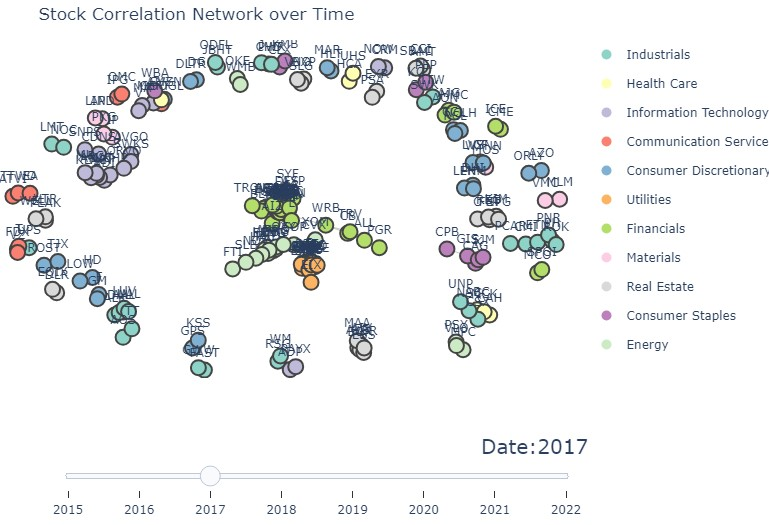

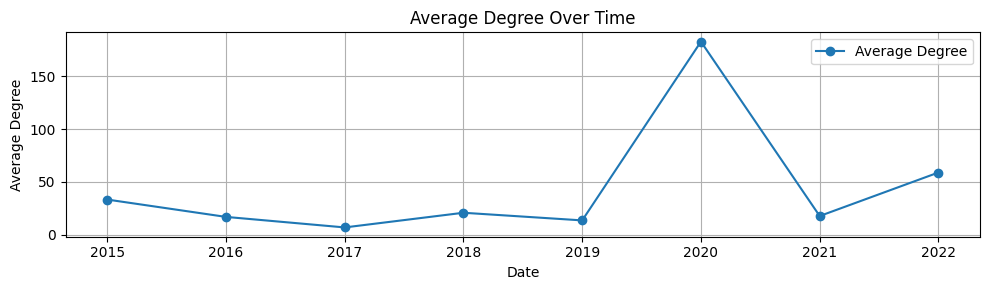

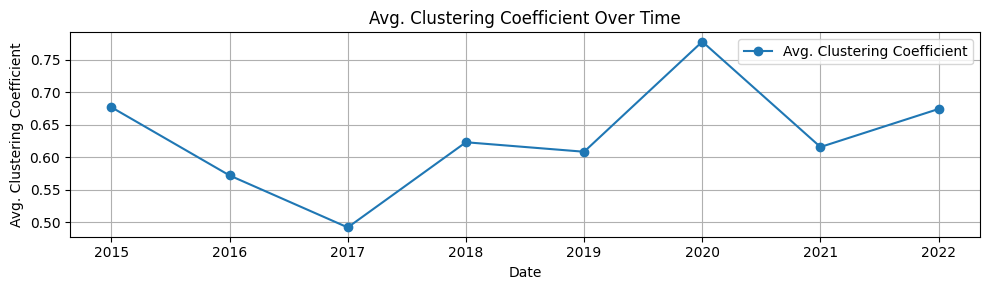

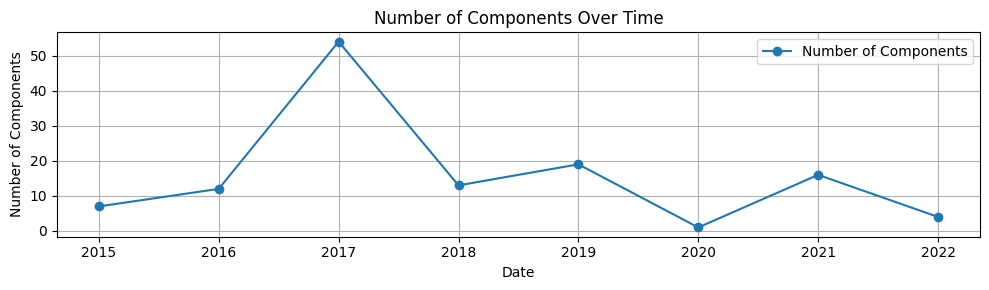

In [15]:
network_metrics_separate(correlations, threshold_corr=0.6)

Analyzing the combined visualizations enriches our understanding of stock market dynamics and network behavior. In the correlation network plot, we observe clusters of interconnected stocks, each representing stocks with correlations above the chosen threshold (0.6). Nodes' coloring based on sectors provides further insights into sector-based relationships.

Considering the network metrics line plots, we discern trends in the network's characteristics. The decreasing average degree suggests a gradual transition from high interconnectedness to a more dispersed network structure. The fluctuations in the average clustering coefficient reflect changing patterns of stock clustering. Notably, the singular large component in 2020, as evident in the "Number of Components Over Time" plot, coincides with the unprecedented impact of the COVID-19 pandemic on stock behavior.

These visualizations collectively present a holistic view of stock dynamics, sector interactions, and evolving network attributes. The insights gained enable us to interpret stock relationships and understand the interplay between stocks over time. As we navigate through these interactive visualizations, we embark on a journey of discovering stock market complexities, unraveling trends, and comprehending the market's responses to significant events.

---

By examining these combined visualizations, we gain a comprehensive understanding of the changing dynamics within the stock market, the sector-based relationships, and the evolving network characteristics. The interactive nature of these plots empowers us to explore how stocks interact, how network structures change over time, and how these trends may correlate with real-world events.

## Communities

### Dynamic Community Analysis of Stock Network

The dynamic community analysis visualization employs Dash, enhancing our understanding of stock network communities over time. By utilizing the Louvain algorithm, we partition the stock network into distinct communities that maximize modularity. Each stock (node) is assigned a color based on its community affiliation. Dropdown menus for selecting the year and community clusters offer an interactive experience, allowing us to explore the evolution of community structures within the stock network.



In [16]:
app = dash.Dash(__name__, external_stylesheets=["https://maxcdn.bootstrapcdn.com/bootstrap/4.0.0/css/bootstrap.min.css"])

app.layout = html.Div([
    dcc.Dropdown(id='year-dropdown', options=[{'label': date, 'value': date} for date in sorted(correlations.keys())], value=list(correlations.keys())[0], multi=False),
    dcc.Dropdown(id='partition-dropdown', options=[], value=-1),
    dcc.Graph(id='network-graph'),
])


@app.callback(
    [Output('network-graph', 'figure'), Output('partition-dropdown', 'options')],
    [Input('year-dropdown', 'value'), Input('partition-dropdown', 'value')])
def update_graph(selected_year, selected_partition):
    corr_matrix = correlations[selected_year]
    stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))

    G = create_graph_from_corr(corr_matrix, threshold_corr=0.6)
    partition = cl.best_partition(G, random_state=42)

    unique_partitions = list(set(partition.values()))
    partition_options = [{'label': f'All Clusters', 'value': -1}] + [{'label': f"Cluster {p}", 'value': p} for p in unique_partitions]

    if selected_partition == -1:
        nodes_to_display = list(G.nodes())
        if selected_year == '2020':
            nodes_to_display = list(G.nodes())[:200]
    else:
        nodes_to_display = [node for node, part in partition.items() if part == selected_partition]

    subgraph = G.subgraph(nodes_to_display)

    pos = nx.kamada_kawai_layout(subgraph)

    node_colors = [partition[node] for node in nodes_to_display]

    edge_x = []
    edge_y = []
    for edge in subgraph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines', showlegend=False)

    node_traces = []

    if selected_partition == -1:
        num_clusters, hue_step = len(unique_partitions), 360.0 / len(unique_partitions)

        for cluster_value in unique_partitions:
            cluster_nodes = [node for node in nodes_to_display if partition[node] == cluster_value]
            node_data = [(pos[node], f"{node}<br>Cluster: {cluster_value}<br>Sector: {stock_to_sector[node]}") for node in cluster_nodes]

            rgb = colorsys.hsv_to_rgb((cluster_value * hue_step) / 360.0, 1, 1)
            cluster_color = '#%02x%02x%02x' % tuple(int(val * 255) for val in rgb)

            trace = go.Scatter(x=[data[0][0] for data in node_data], y=[data[0][1] for data in node_data], mode='markers+text', text=cluster_nodes, hoverinfo='text', hovertext=[data[1] for data in node_data], marker=dict(color=cluster_color, size=15, line_width=2), name=f"Cluster {cluster_value}", textposition='top center')
            node_traces.append(trace)

        layout = go.Layout(title=f'Stock Correlation Network for {selected_year}', showlegend=True, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=1600, height=800)

        figure = {'data': [edge_trace] + node_traces, 'layout': layout}

    else:
        node_data = [(pos[node], f"{node}<br>Cluster: {partition[node]}<br>Sector: {stock_to_sector[node]}") for node in nodes_to_display]

        node_trace = go.Scatter(x=[data[0][0] for data in node_data], y=[data[0][1] for data in node_data], mode='markers+text', text=nodes_to_display, hoverinfo='text', hovertext=[data[1] for data in node_data], marker=dict(showscale=False, colorscale='YlGnBu', size=15, color=node_colors, line_width=2), textposition='top center')

        layout = go.Layout(title=f'Stock Correlation Network for {selected_year}', showlegend=False, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=1000, height=100)

        figure = {'data': [edge_trace, node_trace], 'layout': layout}

    return figure, partition_options

In [ ]:
app.run_server(mode='external', host="0.0.0.0", port=1005, debug=True)

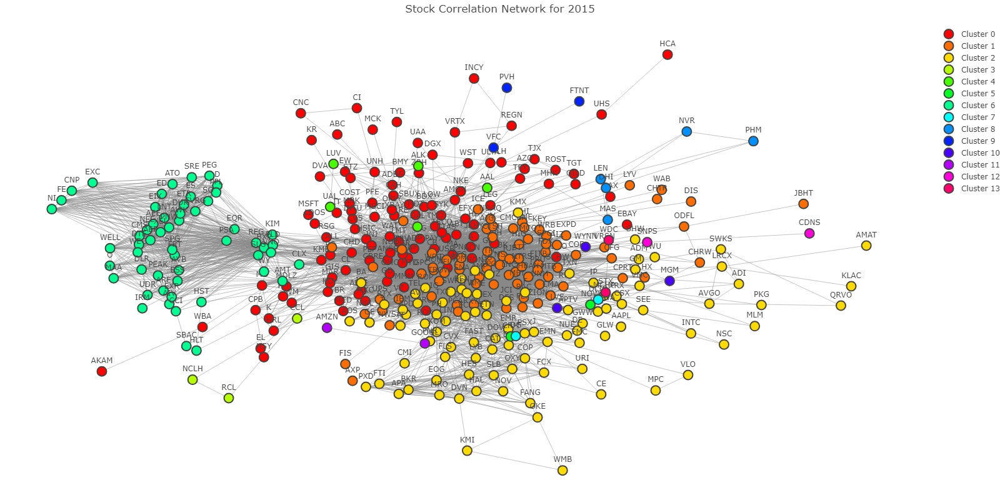

The interactive visualization reveals the evolution of stock network communities and their relationships over the years. Each node is color-coded according to its assigned community, providing insights into sector-independent clustering. By selecting different years and community clusters through the dropdown menus, we can analyze how community compositions and structures change over time.

In 2015, a notable observation is the partial alignment of communities with sectors, though some deviations exist. For instance, the turquoise community comprises a mix of utility and real estate stocks. The red community primarily consists of health care stocks. This partial alignment suggests a complex interplay between sector-based relationships and intrinsic stock behaviors.

Moving forward, the clarity of community divisions becomes more pronounced. In 2016, communities are more distinct, corresponding more closely with sectors. The pink, blue, and light green communities represent consumer staples, utilities, and real estate, respectively.

A shift occurs in 2017, as the number of communities increases significantly, resulting in less distinct partitions. This phenomenon is likely due to the intricate interplay of stock behaviors, resulting in less discernible community boundaries. However, the situation improves in 2018 and 2019, with clearer community distinctions.

The unprecedented events of 2020, marked by the COVID-19 pandemic's impact, lead to an interconnected stock market. The Louvain algorithm detects two major communities, a result of stocks moving in tandem due to market-wide uncertainties.

In the subsequent years, as the world adapts, stock behaviors return to a more typical pattern. The number of communities increases, signifying a resurgence of sector-independent groupings.

The visualization not only showcases the stock market's inherent complexities but also underscores the dynamic interactions between stocks and sectors. It illustrates how community dynamics evolve over time and emphasizes the impact of external events on stock behaviors. The combination of community insights and interactive features elevates our understanding of stock network dynamics, aiding us in deciphering intricate market behaviors and their underlying causes.


### Stock Community Evolution Over Time

The stock community evolution analysis visualization, powered by Dash, enables an in-depth exploration of how individual stocks' community affiliations evolve over time. By selecting a specific stock from the dropdown menu, we can observe the changing communities that the chosen stock is a part of during each year. This interactive approach allows us to understand how a stock's relationships with other stocks have transformed over the analyzed period.

In [18]:
app = dash.Dash(__name__, external_stylesheets=["https://maxcdn.bootstrapcdn.com/bootstrap/4.0.0/css/bootstrap.min.css"])

app.layout = html.Div([
    dcc.Dropdown(id='year-dropdown', options=[{'label': date, 'value': date} for date in sorted(correlations.keys())], value=list(correlations.keys())[0], multi=False),
    dcc.Dropdown(id='partition-dropdown', options=[], value=-1),
    dcc.Graph(id='network-graph'),
])


@app.callback(
    [Output('network-graph', 'figure'), Output('partition-dropdown', 'options')],
    [Input('year-dropdown', 'value'), Input('partition-dropdown', 'value')]
)
def update_graph(selected_year, selected_stock):
    corr_matrix = correlations[selected_year]
    stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))
    ticker_to_name = dict(zip(df_SP500['Symbol'], df_SP500['Name']))

    G = create_graph_from_corr(corr_matrix, threshold_corr=0.6)
    partition = cl.best_partition(G, random_state=42)

    unique_partitions = list(set(partition.values()))
    partition_options = [{'label': f'All Clusters', 'value': -1}] + [{'label': f"{p}", 'value': p} for p in list(G.nodes)]

    selected_partition = -1 if selected_stock == -1 else partition[selected_stock]
    if selected_partition == -1:
        nodes_to_display = list(G.nodes())
        if selected_year == '2020':
            nodes_to_display = list(G.nodes())[:200]
    else:
        nodes_to_display = [node for node, part in partition.items() if part == selected_partition]

    subgraph = G.subgraph(nodes_to_display)

    pos = nx.kamada_kawai_layout(subgraph)

    node_colors = [partition[node] for node in nodes_to_display]

    edge_x = []
    edge_y = []
    for edge in subgraph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines', showlegend=False)

    node_traces = []

    if selected_partition == -1:
        num_clusters, hue_step = len(unique_partitions), 360.0 / len(unique_partitions)

        for cluster_value in unique_partitions:
            cluster_nodes = [node for node in nodes_to_display if partition[node] == cluster_value]
            node_data = [(pos[node], f"{node}<br>Cluster: {cluster_value}<br>Sector: {stock_to_sector[node]}") for node in cluster_nodes]

            rgb = colorsys.hsv_to_rgb((cluster_value * hue_step) / 360.0, 1, 1)
            cluster_color = '#%02x%02x%02x' % tuple(int(val * 255) for val in rgb)

            trace = go.Scatter(x=[data[0][0] for data in node_data], y=[data[0][1] for data in node_data], mode='markers+text', text=cluster_nodes, hoverinfo='text', hovertext=[data[1] for data in node_data], marker=dict(color=cluster_color, size=15, line_width=2), name=f"Cluster {cluster_value}", textposition='top center')
            node_traces.append(trace)

        layout = go.Layout(title=f'Stock Correlation Network for {selected_year}', showlegend=True, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=1600, height=800)

        figure = {'data': [edge_trace] + node_traces, 'layout': layout}

    else:
        node_data = [(pos[node], f"{node}<br>Cluster: {partition[node]}<br>Sector: {stock_to_sector[node]}") for node in nodes_to_display]

        node_trace = go.Scatter(x=[data[0][0] for data in node_data], y=[data[0][1] for data in node_data], mode='markers+text', text=nodes_to_display, hoverinfo='text', hovertext=[data[1] for data in node_data], marker=dict(showscale=False, colorscale='YlGnBu', size=15, color=node_colors, line_width=2), textposition='top center')

        layout = go.Layout(title=f'Community for {ticker_to_name[selected_stock]} in {selected_year}', showlegend=False, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=1000, height=100)

        figure = {'data': [edge_trace, node_trace], 'layout': layout}


    return figure, partition_options

In [ ]:
app.run_server(mode='external', host="0.0.0.0", port=1004, debug=True)

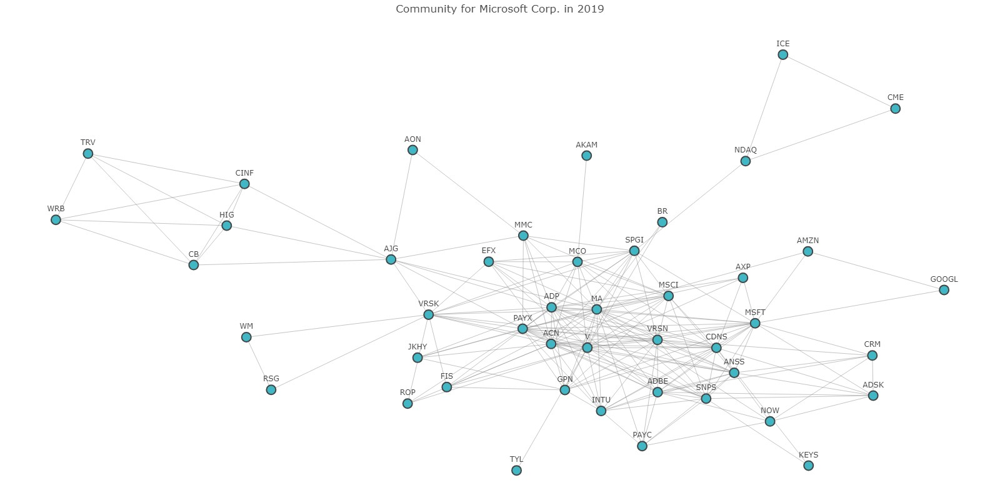

This interactive visualization provides a unique perspective on the dynamic evolution of stock communities over the years. By selecting a specific stock from the dropdown menu, we can trace its journey through various communities and observe how its relationships with other stocks have shifted.

For instance, if we focus on 'Google' as the chosen stock, we can see how its community affiliations have evolved. In 2015, 'Google' was primarily connected to 'Amazon', reflecting their close interactions during that period. As we progress to 2017, we witness 'Google' expanding its connections to include 'Microsoft', thereby broadening its community interactions. Over the subsequent years, 'Google' becomes a part of larger and more diverse communities, indicating its integration with different sectors and stocks.

This visualization offers a dynamic narrative of stock behaviors, showcasing how individual stocks adapt and interact within changing community structures. The interactive nature of this plot grants us an intimate understanding of stock network dynamics, highlighting the significance of each stock's role in shaping the overarching network. By delving into the evolving relationships of specific stocks, we gain insights into their journey of adaptation, collaboration, and transformation over time.

## Correlations

### Yearly Correlation Analysis Between Sectors

In an endeavor to comprehend the intricate relationships between various sectors, we aimed to visualize the year-over-year correlations of each sector pair. This visualization is essentially a matrix of scatter plots, where each cell represents the relationship between a unique pair of sectors across different years.

The primary intention behind this visualization is to:
1. Gauge the trend of correlation for each sector pair over the years.
2. Identify any recurring patterns or anomalies in the relationships.
3. Understand the potential external factors influencing these correlations.

In [20]:
sectors = dict(zip(df_SP500["Symbol"], df_SP500["Sector"]))
sectors_filtered = {k: v for k, v in sectors.items() if k in correlations['2015'].columns}

def average_correlation_in_year(correlation_df, sector_dict, sector1, sector2):
    stocks_sector1 = [stock for stock, sector in sector_dict.items() if sector == sector1]
    stocks_sector2 = [stock for stock, sector in sector_dict.items() if sector == sector2]

    total_corr = 0
    count = 0

    for stock1 in stocks_sector1:
        for stock2 in stocks_sector2:
            if stock1 != stock2:
                total_corr += correlation_df.loc[stock1, stock2]
                count += 1

    return total_corr / count if count != 0 else 0

def build_sector_correlation(correlation_dict, sector_dict):
    sectors = set(sector_dict.values())
    sector_yearly_correlation = {}

    for year, correlation_df in correlation_dict.items():
        yearly_data = {}
        for sector1 in sectors:
            for sector2 in sectors:
                if sector1 != sector2:
                    avg_corr = average_correlation_in_year(correlation_df, sector_dict, sector1, sector2)
                    yearly_data[(sector1, sector2)] = avg_corr
        sector_yearly_correlation[year] = yearly_data

    return sector_yearly_correlation

sector_yearly_correlation = build_sector_correlation(correlations, sectors_filtered)

df = pd.DataFrame(sector_yearly_correlation)
df = df.reset_index(inplace=False)
df.columns = ['Sector_1', 'Sector_2'] + list(df.columns[2:])


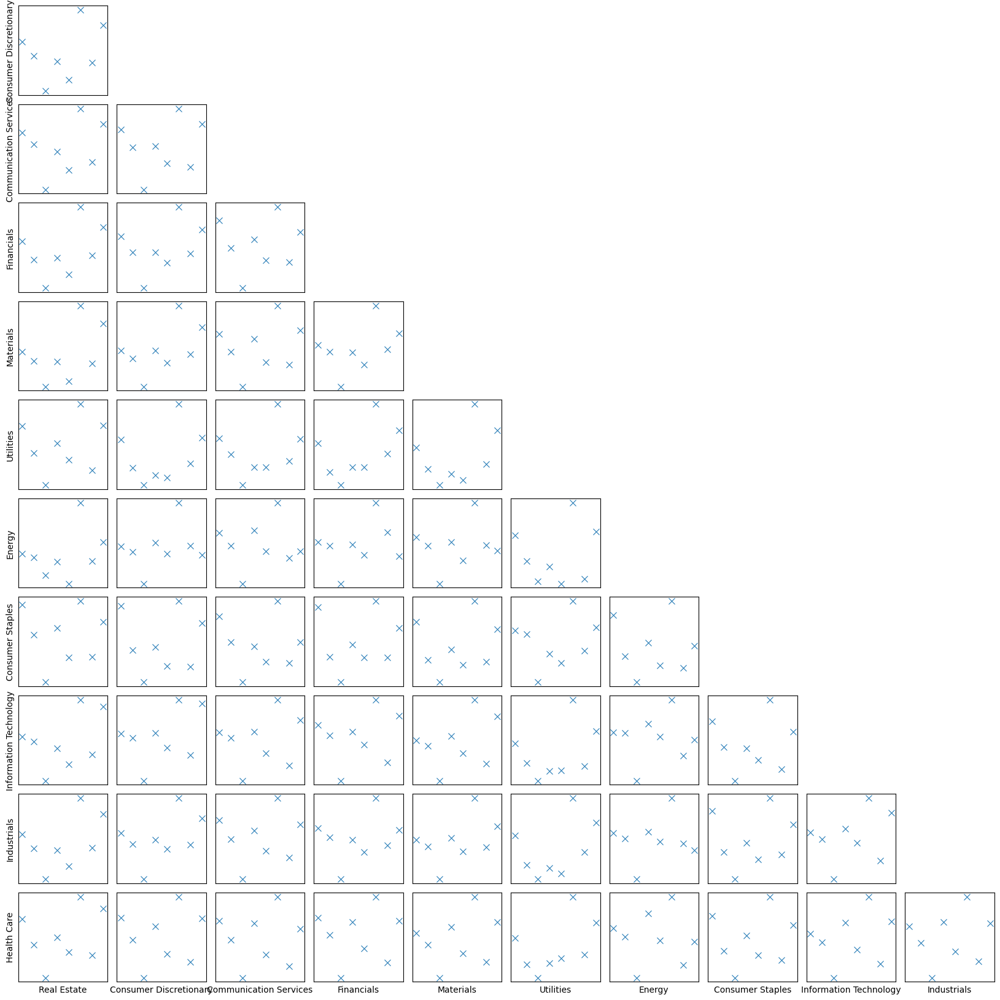

In [21]:
melted_data = df.melt(id_vars=['Sector_1', 'Sector_2'],
                        value_vars=df.columns[2:],
                        var_name='Year',
                        value_name='Value')

sectors = melted_data['Sector_1'].unique()

fig, axes = plt.subplots(len(sectors), len(sectors), figsize=(18, 18))

for i, sector1 in enumerate(sectors):
    for j, sector2 in enumerate(sectors):

        if sector1 == sector2:
            axes[i, j].remove()
            continue

        subset = melted_data[((melted_data['Sector_1'] == sector1) & (melted_data['Sector_2'] == sector2)) |
                             ((melted_data['Sector_1'] == sector2) & (melted_data['Sector_2'] == sector1))]

        sns.scatterplot(data=subset, x='Year', y='Value', s=50, ax=axes[i, j], marker='x')

        axes[i, j].set_xlabel('')
        axes[i, j].set_ylabel('')
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])

        if j == 0:
            axes[i, j].set_ylabel(sector1, fontsize=10)

        if i == len(sectors) - 1:
            axes[i, j].set_xlabel(sector2, fontsize=10)
            for label in axes[i, j].get_xticklabels():
                label.set_rotation(45)
                label.set_horizontalalignment('right')

for i in range(len(sectors)):
    for j in range(i+1, len(sectors)):
        axes[i, j].remove()

plt.tight_layout()
plt.show()

Upon examining the visualization, several noteworthy observations emerge:

1. **Diverse Correlation Dynamics**: There isn't a consistent upward or downward trend in correlations for any sector pair over the years. This suggests that the sectors' interplay is influenced by a multitude of factors and isn't necessarily linear over time.

2. **Recurring Patterns**: A discernible pattern in correlation movements across all sector pairs can be observed:
    - **2015 to 2016**: A slight decrease in correlations.
    - **2016 to 2017**: A sharp decline, with correlations reaching their lowest points.
    - **2017 to 2018**: A rebound, with correlations increasing.
    - **2018 to 2019**: A modest decrease.
    - **2019 to 2020**: A dramatic surge, which could be attributed to the global impact of COVID-19, leading sectors to move in tandem due to global economic shocks.
    - **2020 to 2021**: A return to 2019 levels, indicating a potential stabilization or recovery from the pandemic's effects.
    - **2021 to 2022**: Another increase in correlations.

3. **Unique Intensities for Each Pair**: While the general pattern is consistent across sector pairs, the magnitude or intensity of change varies. Some pairs might exhibit more profound fluctuations, while others remain relatively stable.


The visualization offers a panoramic view of how sectors interact with each other over time. The patterns, especially the dramatic shifts around 2020, underscore the profound influence of global events like the COVID-19 pandemic on market dynamics. While the overall trend showcases a synchronized dance of correlations, the individual magnitudes remind us of the unique characteristics and vulnerabilities of each sector pair.

### Heatmap Analysis of Average Yearly Correlations Between Sectors

In the complex mosaic of financial markets, understanding sectoral interdependencies is crucial. To capture a holistic view of these relationships, we've chosen to visualize the average yearly correlations between sectors. By aggregating yearly data, we aim to smooth out short-term fluctuations and provide a clearer depiction of longer-term trends, thus offering a more synthesized insight into how sectors relate to each other over time.

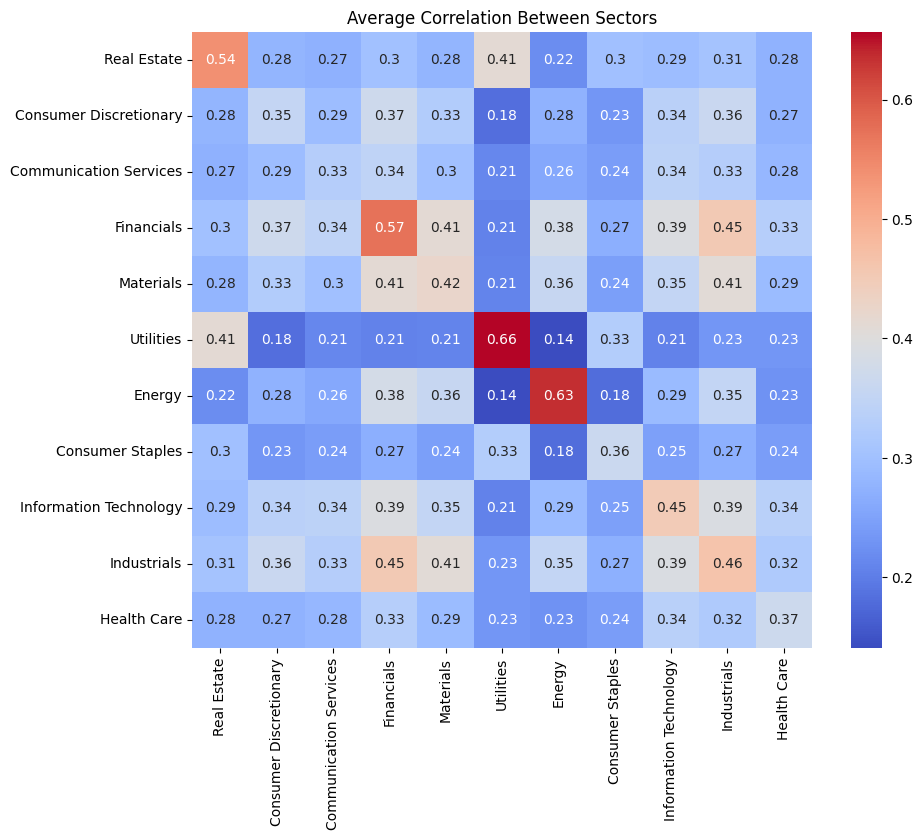

------------------------------------------------------------------------------------------------------------------------------------------------------
Highest correlation is between ('Utilities', 'Utilities') with a value of 0.66
Lowest correlation is between ('Energy', 'Utilities') with a value of 0.14


In [22]:
sector_correlations = defaultdict(list)

for year, stock_correlation_df in correlations.items():
    stocks = stock_correlation_df.columns
    for stock1 in stocks:
        for stock2 in stocks:
            if stock1 != stock2:
                sector1 = sectors_filtered[stock1]
                sector2 = sectors_filtered[stock2]
                sector_pair = tuple(sorted([sector1, sector2]))
                sector_correlations[sector_pair].append(stock_correlation_df.loc[stock1, stock2])

average_sector_correlations = {}
for sector_pair, values in sector_correlations.items():
    average_sector_correlations[sector_pair] = sum(values) / len(values)

unique_sectors = list(set(sectors_filtered.values()))
heatmap_data = pd.DataFrame(0, index=unique_sectors, columns=unique_sectors)

for (sector1, sector2), value in average_sector_correlations.items():
    heatmap_data.loc[sector1, sector2] = value
    heatmap_data.loc[sector2, sector1] = value

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm')
plt.title('Average Correlation Between Sectors')
plt.show()

max_corr = max(average_sector_correlations, key=average_sector_correlations.get)
min_corr = min(average_sector_correlations, key=average_sector_correlations.get)
print('-'*150)
print(f'Highest correlation is between {max_corr} with a value of {average_sector_correlations[max_corr]:.2f}')
print(f'Lowest correlation is between {min_corr} with a value of {average_sector_correlations[min_corr]:.2f}')


In the heatmap's palette of correlations, nuances of sectoral relationships emerge, painting a story of market interdependencies.

**Self-Correlation Anomalies**: The less-than-perfect self-correlations observed in sectors like Consumer Discretionary and Communication Services hint at their inherent diversities. Consumer Discretionary's broad umbrella, from luxury to essentials, can lead to varying performances. On the other hand, the swift evolution of communication technologies and the diverse entities within the Communication Services sector can account for its fluctuating correlation.

**Stable Performers**: Utilities, Energy, and Real Estate sectors exhibit strong self-correlations. The consistent demand for Utilities and Energy, pivotal for daily life and industrial activities, lends them stability. Real Estate, being a tangible and essential asset, showcases consistent multi-year trends.

**Inter-Sector Dynamics**: The Financials & Industrials pair, with a 0.45 correlation, possibly share mutual sensitivities to broader economic cycles and global trade dynamics. The Utilities & Real Estate correlation of 0.41 might be rooted in their shared reactions to interest rate shifts.

**General Observations**: The prevalence of low correlations (below 0.4) for many sector pairs suggests a balancing out of yearly fluctuations when viewed over a multi-year lens.

In Conclusion, the heatmap emphasizes the intertwined nature of sectors, underscoring the importance of recognizing these dynamics for informed decision-making in financial strategies.

### Analyzing Highest Correlations among Stocks by Year

This visualization aims to uncover overarching trends and shifts in the stock market's correlation dynamics over the years. By examining the top 5 correlation pairs annually, we gain a comprehensive understanding of the sectors that consistently demonstrate strong interconnections, as well as how these patterns evolve.

In [23]:
def find_top_correlations(correlations, n=5):
    """
    Finds the stocks with the highest correlations for each year.

    :param correlations: Dictionary with years as keys and correlation matrices as values.
    :param df_SP500: DataFrame containing Symbol and Sector columns.
    :return: Dictionary with years as keys and a list of stock pairs with their correlations for highest correlation.
    """
    result = {}
    stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))

    for year, corr_matrix in correlations.items():
        df_corr = pd.DataFrame(corr_matrix)
        mask = np.triu(np.ones_like(df_corr, dtype=bool))
        df_masked = df_corr.mask(mask)

        flat_corr = df_masked.stack()
        sorted_corr = flat_corr.sort_values()

        top_n = [(pair, value, (stock_to_sector[pair[0]], stock_to_sector[pair[1]])) for pair, value in sorted_corr.tail(n).items()]

        result[year] = {f'top_{n}': top_n}
    return result

n = 5
top_correlations = find_top_correlations(correlations, n=n)
for year, data in top_correlations.items():
    print(f"Year: {year}")
    print(f"Top {n} Correlations:")
    for (pair, value, sectors) in data[f'top_{n}']:
        print(f"{pair} from sectors {sectors}: {value:.3f}")
    print('-' * 50)

Year: 2015
Top 5 Correlations:
('REG', 'FRT') from sectors ('Real Estate', 'Real Estate'): 0.917
('MET', 'LNC') from sectors ('Financials', 'Financials'): 0.918
('DTE', 'CMS') from sectors ('Utilities', 'Utilities'): 0.918
('REG', 'KIM') from sectors ('Real Estate', 'Real Estate'): 0.919
('JPM', 'C') from sectors ('Financials', 'Financials'): 0.919
--------------------------------------------------
Year: 2016
Top 5 Correlations:
('WEC', 'CMS') from sectors ('Utilities', 'Utilities'): 0.919
('C', 'BAC') from sectors ('Financials', 'Financials'): 0.924
('PRU', 'LNC') from sectors ('Financials', 'Financials'): 0.930
('XEL', 'WEC') from sectors ('Utilities', 'Utilities'): 0.930
('XEL', 'CMS') from sectors ('Utilities', 'Utilities'): 0.938
--------------------------------------------------
Year: 2017
Top 5 Correlations:
('XEL', 'CMS') from sectors ('Utilities', 'Utilities'): 0.874
('UNM', 'LNC') from sectors ('Financials', 'Financials'): 0.885
('CMA', 'CFG') from sectors ('Financials', 'Fin

Analyzing the results across the years reveals significant and recurring trends that provide valuable insights into the stock market's landscape:

- **Sectoral Influence:** Throughout the years, certain sectors consistently exhibit strong correlations among stocks within their domain. Notably, the utilities, financials, and real estate sectors frequently demonstrate interconnectedness, suggesting that these sectors play a vital role in shaping the overall market dynamics.

- **Sector Diversification:** Over time, correlations become more diversified, indicating a broadening of inter-sectoral relationships. This diversification might signify evolving market trends and changing investor behaviors.

- **External Events Impact:** In 2020, the COVID-19 pandemic's impact is evident, resulting in a market-wide correlation surge. This phenomenon is attributed to global economic uncertainty and demonstrates the market's sensitivity to external factors.

- **Post-Pandemic Adjustment:** Following 2020, market correlations start to stabilize, reflecting the market's gradual adjustment to post-pandemic conditions. Notably, financial stocks maintain strong correlations, highlighting sector-specific trends.

- **Emergence of New Sectors:** In 2022, a noticeable emergence of correlations within different sectors, such as consumer discretionary and materials, signals potential shifts in market dynamics and investment strategies.

Overall, this visualization emphasizes the ever-changing nature of the stock market, where sectoral influences, external events, and evolving investor sentiments intertwine to shape correlations among stocks. These insights offer investors a broader perspective on market dynamics and provide analysts with valuable clues for understanding the market's complex interactions.

### Correlated Stock Pairs in Different Years

This visualization presents a grid of 2x4 cells, each representing a specific year, showcasing the most correlated stock pairs for that year. The visualization emphasizes the correlation between stock pairs by plotting their adjusted close prices over time and adding vertical lines to highlight the year of peak correlation. This allows us to identify stocks that exhibit similar behavior not only during the correlated year but also across different periods.

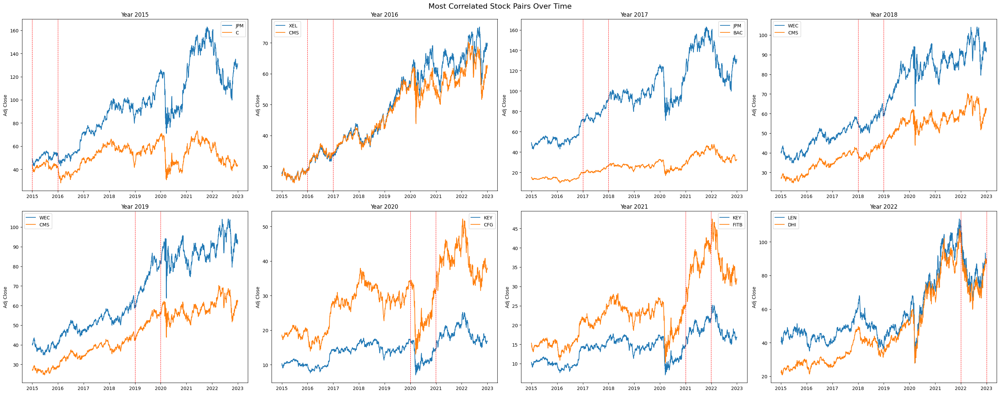

In [24]:
adj_close_data = {}
top_correlations = find_top_correlations(correlations, n=1)

for year, data in top_correlations.items():
    top_corr_pairs = data[f'top_1']
    year_adj_close = {}

    for (pair, _, _) in top_corr_pairs:
        for stock_symbol in pair:
            if stock_symbol not in year_adj_close:
                year_adj_close[stock_symbol] = df_stocks[df_stocks['Symbol'] == stock_symbol][['Date', 'Adj Close']]

    adj_close_data[year] = year_adj_close

plt.figure(figsize=(30, 12))
for idx, (year, adj_close_dict) in enumerate(adj_close_data.items(), start=1):
    plt.subplot(2, 4, idx)
    for stock_symbol, adj_close_series in adj_close_dict.items():
        plt.plot(adj_close_series['Date'], adj_close_series['Adj Close'], label=stock_symbol)
    plt.title(f'Year {year}')
    plt.ylabel('Adj Close')
    plt.legend()

    start_date = pd.to_datetime(f'{year}-01-01')
    end_date = pd.to_datetime(f'{year}-12-31')

    plt.axvline(x=start_date, color='red', linestyle='--', linewidth=0.8)
    plt.axvline(x=end_date, color='red', linestyle='--', linewidth=0.8)


plt.suptitle(f'Most Correlated Stock Pairs Over Time', fontsize=16)
plt.tight_layout()
plt.show()


The grid of cells reveals a compelling insight into the long-term behavior of correlated stock pairs. Beyond the year of peak correlation, we observe consistent trends in the adjusted close prices of these pairs. This stability suggests a lasting and robust relationship between these stocks, hinting at a connection that persists over multiple years.

The significance of this observation lies in its potential implications for investors. The enduring nature of correlated behavior implies that these stocks might respond similarly to various market conditions, economic events, and sector-specific trends. Such knowledge can be leveraged to optimize portfolio diversification and risk management strategies.

These consistent trends in correlated stock pairs also provide insights into the dynamics of different sectors. The shared behavior could signify common sector-specific influences, highlighting the interconnectedness of stocks within a sector. Investors can utilize this understanding to make more informed decisions and anticipate broader market movements.

Additionally, the stability of correlated stock pairs opens avenues for unique investment strategies. Traders can capitalize on these correlations by designing trading strategies that align with the observed behavior. For example, one could employ a long-short strategy, going long on one stock while simultaneously shorting its correlated pair, potentially capitalizing on price discrepancies.

By showcasing the correlated pairs in a long-term context, this visualization bridges the gap between short-term correlation patterns and broader market trends. It provides a holistic view of how stocks interact, offering investors the opportunity to make more informed decisions based on both short-term correlations and the enduring behavior of these pairs.

## Cliques

### Dynamic Cliques of Correlated Stocks Over Time

This visualization utilizes Plotly to create an interactive network of stocks based on their correlation matrices. The visualization features a slider allowing users to explore the evolution of the largest cliques across different years. Stocks within each clique are connected based on their correlation values, and the nodes are colored according to their corresponding sector. The objective is to uncover patterns in the composition of the largest cliques over time.

In [25]:
def create_animated_plot_cliques(correlation_matrices, threshold_corr=0.5):
    """
    Plots an interactive network of stocks based on their correlation matrices.
    :param correlation_matrices: Dictionary where keys are periods and values are correlation matrices.
    :param threshold_corr: Threshold correlation for which two stocks are connected.
    """
    sliders = [{'active': 0, 'yanchor': 'top', 'xanchor': 'left', 'currentvalue': {'font': {'size': 20}, 'prefix': 'Date:', 'visible': True, 'xanchor': 'right'}, 'transition': {'duration': 300, 'easing': 'cubic-in-out'}, 'pad': {'b': 10, 't': 50}, 'len': 0.9, 'x': 0.1, 'y': 0, 'steps': []}]

    fig_data = []
    stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))
    ticker_to_name = dict(zip(df_SP500['Symbol'], df_SP500['Name']))
    unique_sectors = df_SP500['Sector'].unique()
    colors_palette = px.colors.qualitative.Set3
    sector_to_color = dict(zip(unique_sectors, colors_palette))

    for date, corr_matrix in correlation_matrices.items():
        G = create_graph_from_corr(corr_matrix, threshold_corr)
        iga = create_igraph_object(list(G.nodes()), list(G.edges()), False)
        largest_c = iga.largest_cliques()
        h = iga.subgraph(largest_c[0])
        nodes_in_clique = h.vs["name"]
        h = G.subgraph(h.vs["name"])
        pos = nx.spring_layout(h, k=0.2)
        sectors = df_SP500[df_SP500['Symbol'].isin(nodes_in_clique)]['Sector'].tolist()

        edge_x, edge_y = [], []
        for edge in h.edges():
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

        edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines', showlegend=False)

        node_x, node_y, hover_texts = [], [], []
        for node in h.nodes():
            x, y = pos[node]
            node_x.append(x)
            node_y.append(y)
            hover_texts.append(f"{ticker_to_name[node]}<br>Sector: {stock_to_sector[node]}")

        node_colors = [sector_to_color[stock_to_sector[node]] for node in h.nodes()]
        node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=list(h.nodes()), hoverinfo='text', hovertext=hover_texts, marker=dict(showscale=False, color=node_colors, size=15, line_width=2), showlegend=False, textposition='top center')
        fig_data.append([edge_trace, node_trace])
        slider_step = {'args': [[str(date)], {'frame': {'duration': 300, 'redraw': False}, 'mode': 'immediate', 'transition': {'duration': 300}}], 'label': str(date), 'method': 'animate', 'value': str(date)}
        sliders[0]['steps'].append(slider_step)

    for sector, color in sector_to_color.items():
        fig_data[0].append(go.Scatter(x=[None], y=[None], mode='markers', marker=dict(size=10, color=color), legendgroup=sector, showlegend=True, name=sector, hoverinfo='none'))

    layout = go.Layout(title='Largest Cliques over Time', showlegend=True, hovermode='closest', margin=dict(b=0, l=0, r=0, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), sliders=sliders, plot_bgcolor='white', paper_bgcolor='white')
    frames = [go.Frame(data=fig_data[i], name=str(date)) for i, date in enumerate(correlation_matrices.keys())]
    fig = go.Figure(data=fig_data[0], layout=layout, frames=frames)
    return fig

def create_igraph_object(vertices_list, edges_list, is_directed):
    iga = ig.Graph(directed=is_directed)
    iga.add_vertices(len(vertices_list))
    iga.vs["name"] = vertices_list
    v_dict = {vertices_list[i]: i for i in range(len(vertices_list))}
    edges_list = [(v_dict[e[0]], v_dict[e[1]]) for e in edges_list]
    iga.add_edges(edges_list)
    return iga

In [26]:
fig_cliques = create_animated_plot_cliques(correlations, threshold_corr=0.6)
fig_cliques.show()

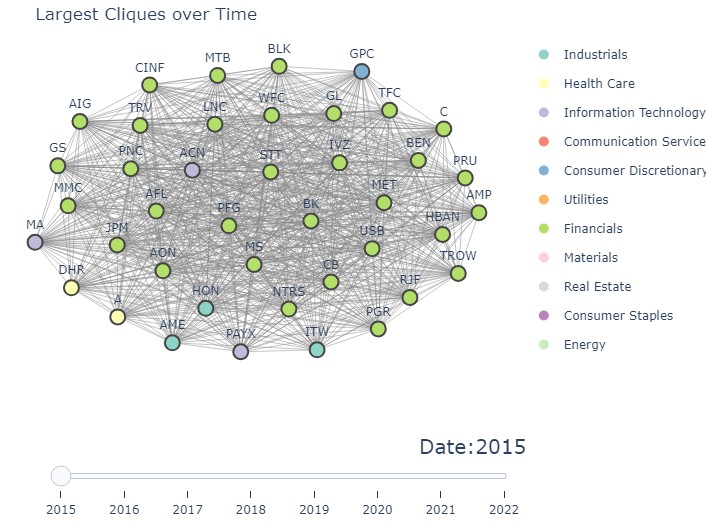

As we navigate through the years using the slider, intriguing patterns emerge within the dynamic cliques:

**2015 - 2019: Financials Dominance**
During this period, the largest cliques predominantly consist of financials stocks. The Financials sector dominates the cliques, potentially indicating a strong interdependence among these stocks within this sector. The presence of a few stocks from other sectors like Industrials and Information Technology in 2015 might highlight initial diversification. However, as we progress through the years, financials become the primary players in the largest cliques.

**2020: Market Impact of COVID-19**
The year 2020 stands out due to the COVID-19 pandemic's profound impact on the stock market. The largest clique reflects increased interconnections among stocks, with a substantial number of nodes forming a highly interconnected network. The diverse range of stocks suggests a shift towards correlation among stocks across various sectors in response to the global market turmoil caused by the pandemic.

**2021: Return to Financial Dominance**
In 2021, the trend seen in the early years of the period resumes. Financials stocks regain prominence in the largest cliques. This suggests a potential return to sector-specific patterns that dominated the earlier years. The Financials sector's significant presence hints at its persistent correlation dynamics over time.

**2022: Diverse Composition**
The year 2022 offers a departure from the previous year, with a more diverse composition in the largest clique. While Financials still play a role, stocks from Consumer Discretionary, Information Technology, and other sectors are now part of the dynamic cliques. This diverse composition could signify evolving market dynamics and a broader cross-sector correlation pattern.

Overall, the visualization underscores the changing dynamics of the largest cliques over the analyzed years. The dominance of financials in some periods and the diversification in others highlight the intricate relationships among stocks and sectors. The dynamic cliques provide valuable insights into sectoral interdependencies and potential market trends, offering investors a deeper understanding of the market's behavior over time.

### Sectoral Evolution - Largest Clique Line Plots

In this visualization, we present a series of Line plots depicting the sizes of the largest cliques for each sector across different years. The aim is to uncover the trends and patterns that highlight how sectors within the stock market interact and evolve over time. By examining the changes in the largest cliques for each sector, we seek to gain insights into sectoral behavior and correlations.

In [27]:
def filter_nodes_by_sector(G, sector_name):
    """
    Returns a subgraph of G that only includes nodes from the specified sector.

    :param G: Original graph.
    :param sector_name: Name of the sector to filter by.
    """
    nodes_from_sector = df_SP500[df_SP500['Sector'] == sector_name]['Symbol'].tolist()
    sub_nodes = [node for node in G.nodes() if node in nodes_from_sector]
    subG = G.subgraph(sub_nodes)
    return subG

In [28]:
sectors = df_SP500['Sector'].unique()

results = {sector: {} for sector in sectors}

for year in correlations.keys():
    G_for_year = create_graph_from_corr(correlations[year], threshold_corr=0.7)

    for sector in sectors:
        subG = filter_nodes_by_sector(G_for_year, sector)
        iga = create_igraph_object(list(subG.nodes()), list(subG.edges()), False)
        largest_c = iga.largest_cliques()

        if largest_c:
            results[sector][year] = len(largest_c[0])
        else:
            results[sector][year] = 0

df_results = pd.DataFrame(results)
fig = px.line(df_results, x=df_results.index, y=sectors, title='Size of Largest Clique by Sector Over Time')
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
    plot_bgcolor='rgb(243, 243, 243)',
    paper_bgcolor='rgb(243, 243, 243)',
    title_font=dict(size=25, color='rgb(0, 0, 0)'),
    legend_title='Sectors',
    xaxis=dict(title='Year', title_font=dict(size=25, color='rgb(107, 107, 107)'), tickfont=dict(size=16, color='rgb(107, 107, 107)')),
    yaxis=dict(title='Size of Largest Clique', title_font=dict(size=25, color='rgb(107, 107, 107)'), tickfont=dict(size=18, color='rgb(107, 107, 107)')))
fig.show()

The Line plots showcasing the sizes of the largest cliques for each sector reveal intriguing insights into the shifting dynamics of the stock market's sectors. Upon analyzing the trends portrayed in the plots, we observe notable phenomena that provide valuable context to the market's behavior.

The plots showcase diverse behavior among sectors, as evidenced by anomalies in self-correlations. Notably, sectors like Consumer Discretionary and Communication Services exhibit less-than-perfect self-correlations, indicating their inherent diversity. The broad spectrum of offerings within Consumer Discretionary and the rapid evolution of communication technologies within Communication Services contribute to these fluctuations.

Sectors like Utilities, Energy, and Real Estate stand out for their stability and strong self-correlations. The steady demand for Utilities and Energy, essential for daily life and industrial activities, underpins their consistent trends. Real Estate, representing a tangible and essential asset, demonstrates resilience over multiple years.


Overall, these Line plots enrich our understanding of sectoral interdependencies and dynamics, providing a valuable perspective for crafting well-informed financial strategies.

# Single Stock Analysis

## Centrality Measures Analysis Over Years

In this analysis, we aimed to investigate how the centrality of a single stock, here specifically investigated the stock "BAC" (Bank of America Corp.), which representing the Financials sector, and has evolved within the stock market network.

We utilized four distinct centrality measures – Betweenness Centrality, Degree Centrality, Closeness Centrality, and Eigenvector Centrality – to gain insights into different aspects of the stock's significance within the network. By observing changes in these centrality measures over the years, we sought to uncover how the stock's position and influence have shifted within the broader market context.

In [29]:
def plot_centrality_over_years(stock_symbol, correlations):
    betweenness_centrality_values = []
    degree_centrality_values = []
    closeness_centrality_values = []
    eigenvector_centrality_values = []

    years = list(correlations.keys())

    for year in years:
        G = create_graph_from_corr(correlations[year], threshold_corr=0.6)

        if stock_symbol in G.nodes():
            dict_betwenness_centrality = nx.betweenness_centrality(G)
            dict_degree_centrality = nx.degree_centrality(G)
            dict_closeness_centrality = nx.closeness_centrality(G)
            dict_eigenvector_centrality = nx.eigenvector_centrality(G)

            betweenness_centrality_values.append(dict_betwenness_centrality[stock_symbol])
            degree_centrality_values.append(dict_degree_centrality[stock_symbol])
            closeness_centrality_values.append(dict_closeness_centrality[stock_symbol])
            eigenvector_centrality_values.append(dict_eigenvector_centrality[stock_symbol])
        else:
            betweenness_centrality_values.append(None)
            degree_centrality_values.append(None)
            closeness_centrality_values.append(None)
            eigenvector_centrality_values.append(None)

    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs[0, 0].plot(years, betweenness_centrality_values, marker='o', linestyle='-')
    axs[0, 0].set_title('Betweenness Centrality')

    axs[0, 1].plot(years, degree_centrality_values, marker='o', linestyle='-')
    axs[0, 1].set_title('Degree Centrality')

    axs[1, 0].plot(years, closeness_centrality_values, marker='o', linestyle='-')
    axs[1, 0].set_title('Closeness Centrality')

    axs[1, 1].plot(years, eigenvector_centrality_values, marker='o', linestyle='-')
    axs[1, 1].set_title('Eigenvector Centrality')

    for ax in axs.flat:
        ax.set_xlabel('Year')
        ax.set_ylabel('Centrality Value')
        ax.grid(True)

    fig.suptitle(f'Centrality Measures for {stock_symbol} Over Years')
    plt.tight_layout()
    plt.show()

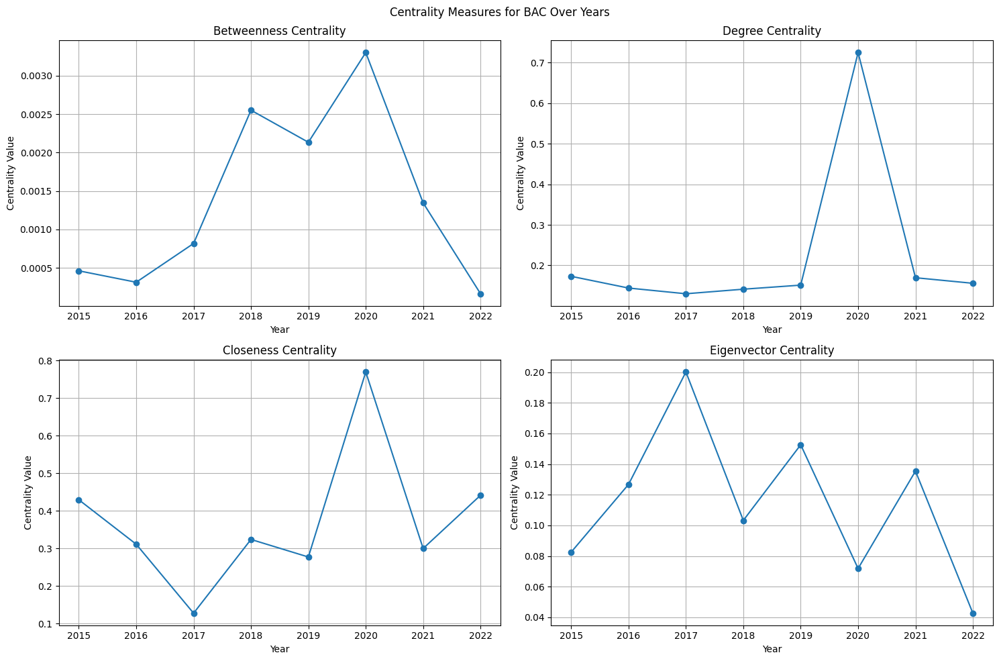

In [30]:
stock_symbol = "BAC"
plot_centrality_over_years(stock_symbol, correlations)

The line plots presented in the visualization depict the values of various centrality measures for the stock "BAC" across the years 2015 to 2022. These centrality measures provide a multidimensional view of the stock's behavior within the market network.

- **Betweenness Centrality:** The plot reveals fluctuations in the Betweenness Centrality values over the years. While the values are generally low, the occasional spikes suggest periods when "BAC" played a crucial role in connecting different stocks, possibly transmitting critical market information. The declining values in 2022 indicate reduced bridging influence.

- **Degree Centrality:** The Degree Centrality plot demonstrates the stock's consistent connectivity with other stocks throughout the years. Its relatively stable values reflect the stock's steady interactions within the network, contributing to its resilience as a well-connected entity.

- **Closeness Centrality:** The Closeness Centrality graph illustrates an intriguing surge in 2020, signifying that "BAC" was uniquely positioned to swiftly disseminate information within the network during the COVID-19 pandemic. This phenomenon aligns with the heightened market volatility and increased interconnectedness observed during that period.

- **Eigenvector Centrality:** The plot for Eigenvector Centrality showcases fluctuations in the stock's association with other influential stocks. The peak in 2017 suggests that "BAC" was linked to other well-connected stocks in that year, while the decline in 2022 implies a shift in its connections and associations.

Overall, the analysis of centrality measures for "BAC" provides valuable insights into its role as a conduit for information, its level of connectedness, and its position within the broader market network. The choice of "BAC" as the focal stock offers a window into the dynamics of the financial sector and its interactions within the intricate web of market interdependencies.

## Exploring Cross-Sector Correlations of Diverse Stocks

In this visualization, we aimed to explore the cross-sector correlation between representative stocks from different sectors that have diverse operations spanning across multiple sectors. The selected stocks are AAPL (Apple), GOOGL (Alphabet), AMZN (Amazon), JPM (JPMorgan Chase), GE (General Electric), and NEE (NextEra Energy). For each stock and sector combination, we plotted a box plot to visualize the distribution of correlation values. This analysis helps us understand the degree to which these stocks are correlated with various sectors, shedding light on their diverse operations and interactions across the market.

In [31]:
def plot_boxplots(year, stock_list):
    fig, axes = plt.subplots(2, 3, figsize=(16, 9))

    for i, ax in enumerate(axes.flatten()):
        if i < len(stock_list):
            stock = stock_list[i]
            sector_data = pd.DataFrame(correlations[year][stock])
            stock_to_sector = dict(zip(df_SP500['Symbol'], df_SP500['Sector']))
            sector_data['sector'] = sector_data.index.map(stock_to_sector)
            sns.boxplot(x='sector', y=stock, data=sector_data, ax=ax)

            ax.set_title(stock)
            ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
            ax.axhline(y=0.5, c='red', linestyle='dashed')

    plt.tight_layout()
    plt.show()

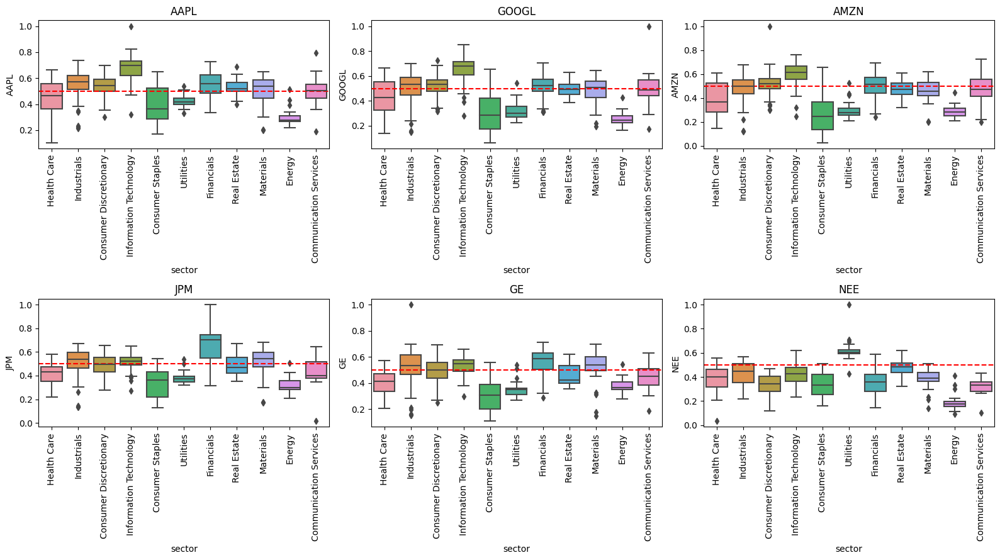

In [32]:
stocks = ['AAPL', 'GOOGL', 'AMZN', 'JPM', 'GE', 'NEE']
plot_boxplots('2022', stocks)

The box plots presented above provide a comprehensive view of the cross-sector correlations for each of the selected representative stocks. Let's delve into the observations for each stock:

1. **AAPL (Apple):**
   - Apple's correlations with various sectors reveal interesting insights. The Information Technology sector shows consistently higher correlations, reflecting the significance of Apple's software ecosystems (iOS, macOS, App Store). Additionally, the Consumer Discretionary sector, associated with Apple's array of products, including iPhones, iPads, and Macs, also displays notable correlations. However, the correlations with sectors like Health Care and Energy are comparatively lower, indicating less direct impact.

2. **GOOGL (Google):**
   - Google's correlations emphasize its diverse operations. The Communication Services sector, home to Google's services like search, YouTube, and advertising, exhibits relatively higher correlations. The Information Technology sector, including Google Cloud and Android OS, also shows strong correlations. Conversely, sectors like Consumer Staples and Energy exhibit lower correlations, suggesting a potentially weaker influence.

3. **AMZN (Amazon):**
   - Amazon's correlations illustrate its extensive reach across sectors. The Consumer Discretionary sector, encompassing Amazon's e-commerce platform and devices, displays prominent correlations. Similarly, the Communication Services sector, hosting Amazon Prime Video and Amazon Music, exhibits notable correlations. The correlations with sectors such as Health Care and Utilities are lower, indicating potentially indirect connections.

4. **JPM (JPMorgan Chase):**
   - JPMorgan Chase's correlations highlight its role in the financial sector. Correlations are particularly significant within the Financials sector itself, reflecting its core banking services and lending operations. However, correlations with other sectors, such as Consumer Discretionary and Information Technology, are lower, suggesting a more contained influence.

5. **GE (General Electric):**
   - General Electric's correlations showcase its diverse presence across sectors. The Industrials sector, encompassing aviation and manufacturing, displays substantial correlations. Additionally, Health Care, where GE operates in medical imaging and diagnostics, shows notable correlations. Correlations with sectors like Communication Services and Consumer Staples are comparatively lower, indicating less direct impact.

6. **NEE (NextEra Energy):**
   - NextEra Energy's correlations emphasize its role in energy and utilities. The Utilities sector, which includes traditional electricity generation and distribution, displays high correlations. The Energy sector, covering renewable energy, also shows notable correlations. Conversely, correlations with sectors like Health Care and Information Technology are lower, suggesting a potentially indirect influence.

By examining the cross-sector correlations of these representative stocks, we gain insights into how these stocks' operations intersect with different sectors. These insights contribute to a better understanding of the complex interdependencies within the S&P 500 index, guiding further analyses and facilitating a comprehensive view of the market dynamics.